In [25]:
#importing some useful packages

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import glob
%matplotlib inline

In [26]:
### Calibration

cor_h = 9
cor_v = 6
objp = np.zeros((cor_v*cor_h,3), np.float32)
objp[:,:2] = np.mgrid[0:cor_h, 0:cor_v].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (cor_h,cor_v), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        cv2.drawChessboardCorners(img, (cor_h,cor_v), corners, ret)
        #write_name = 'corners_found'+str(idx)+'.jpg'
        #cv2.imwrite(write_name, img)
        cv2.imshow('img', img)
        cv2.waitKey(500)

cv2.destroyAllWindows()

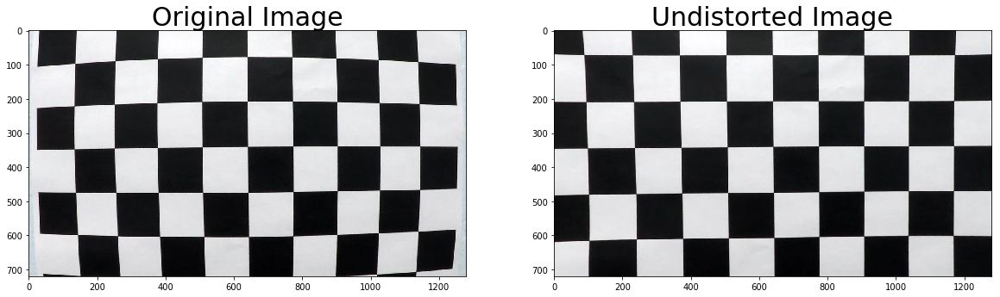

In [27]:
### Undistort

import pickle
%matplotlib inline

# Test undistortion on an image
img = cv2.imread('camera_cal/calibration1.jpg')
img_size = (img.shape[1], img.shape[0])

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)


dst = cv2.undistort(img, mtx, dist, None, mtx)
cv2.imwrite('camera_cal/test_undist.jpg',dst)

# Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open( "camera_cal/wide_dist_pickle.p", "wb" ) )
#dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)

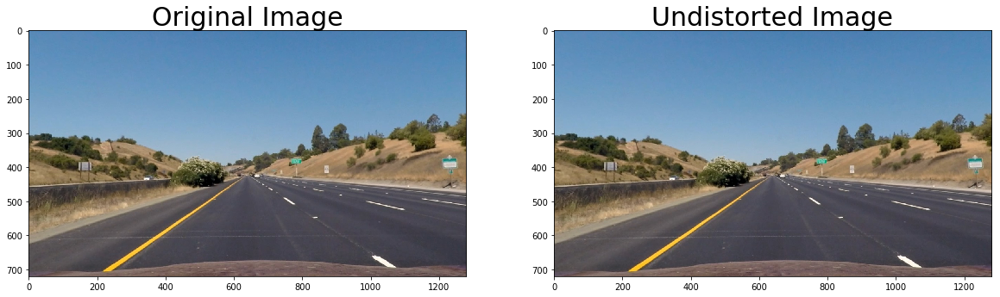

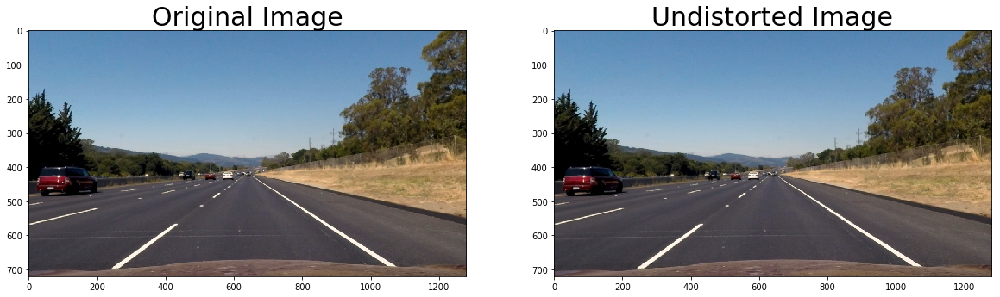

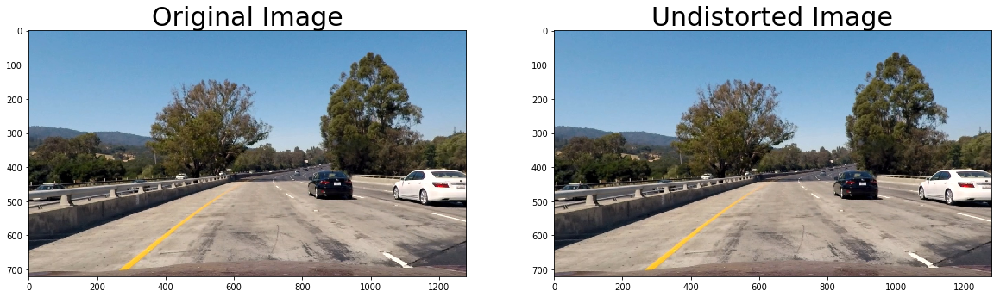

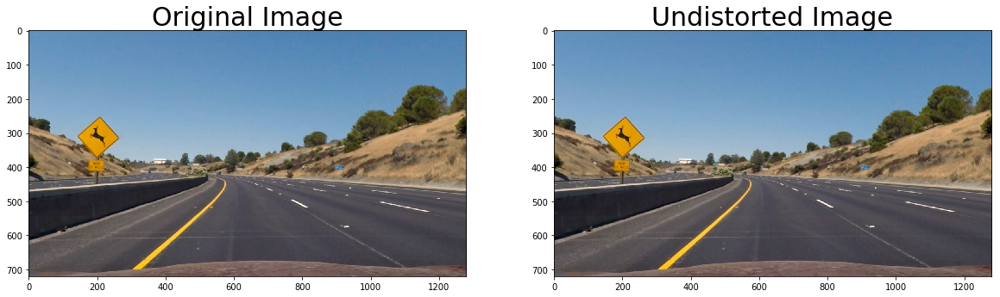

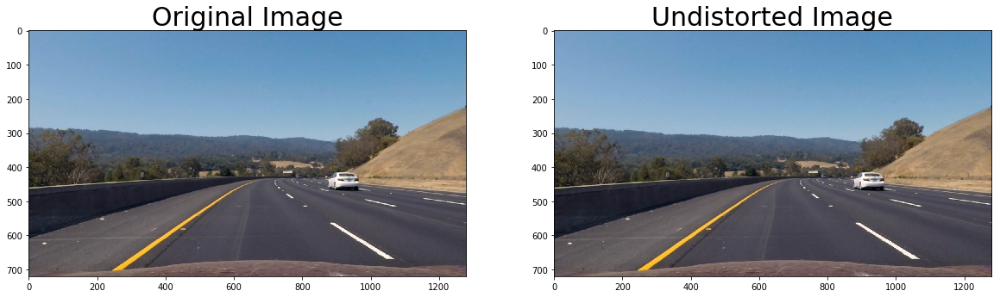

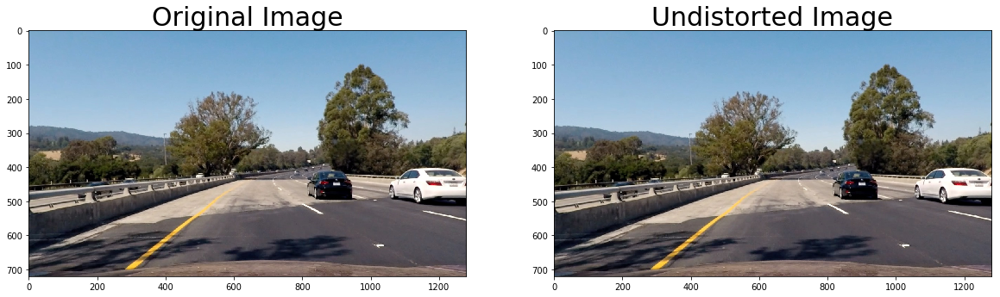

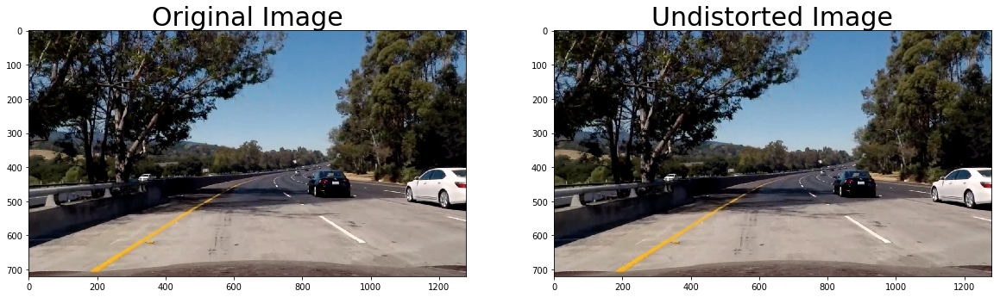

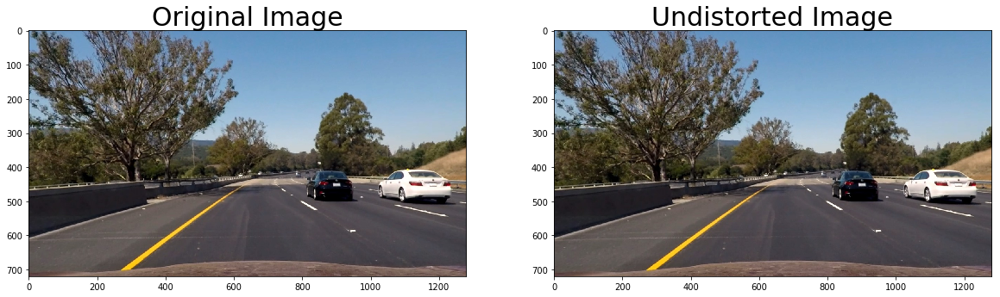

In [28]:
### Undistort

import pickle
%matplotlib inline
import os
import ntpath

# Make a list of test images
images = glob.glob('test_images/*.jpg')

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)
    
# Step through the list 
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    img_size = (img.shape[1], img.shape[0])
    

    dst = cv2.undistort(img, mtx, dist, None, mtx)
    new_file_name = 'test_images/undistorted/' + os.path.splitext(ntpath.basename(fname))[0] + '_undist.jpg'
    cv2.imwrite(new_file_name, dst)

    # Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
    dist_pickle = {}
    dist_pickle["mtx"] = mtx
    dist_pickle["dist"] = dist
    pickle.dump( dist_pickle, open( "camera_cal/wide_dist_pickle.p", "wb" ) )
    img = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
    dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
    # Visualize undistortion
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(dst)
    ax2.set_title('Undistorted Image', fontsize=30)



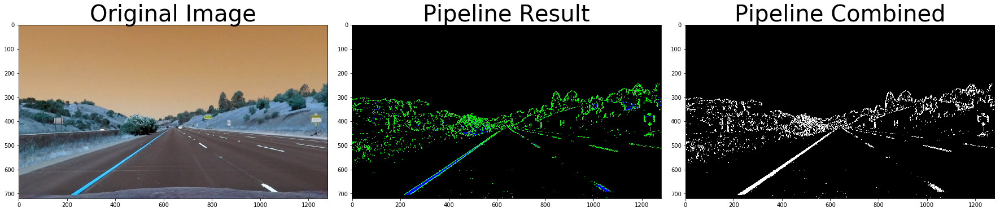

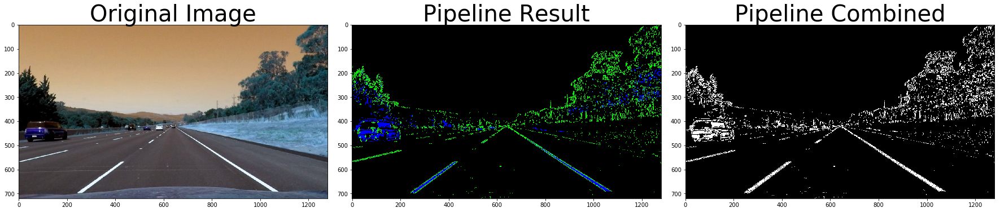

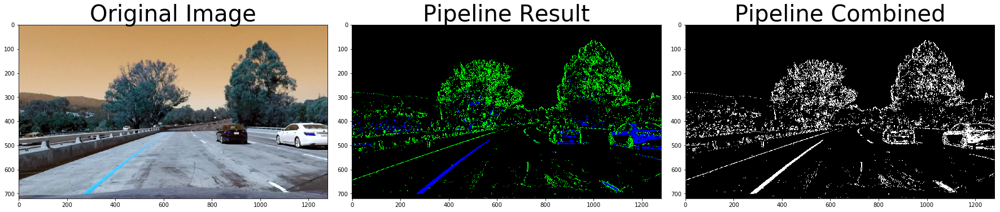

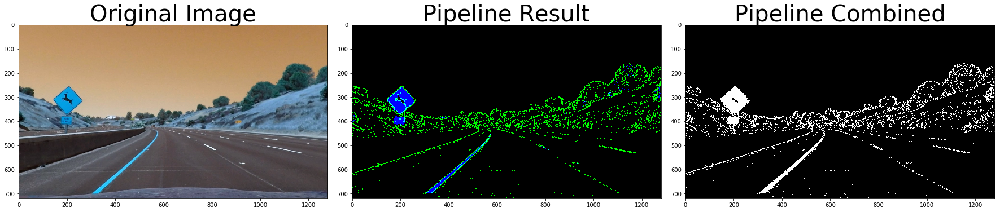

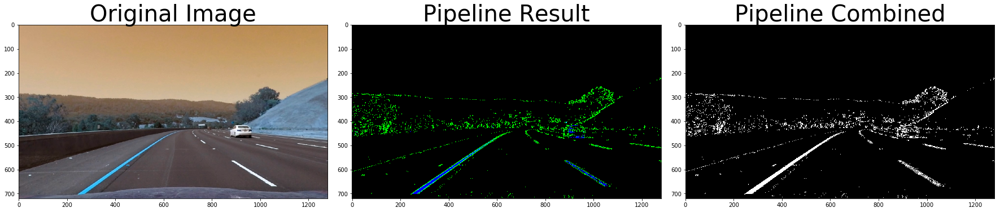

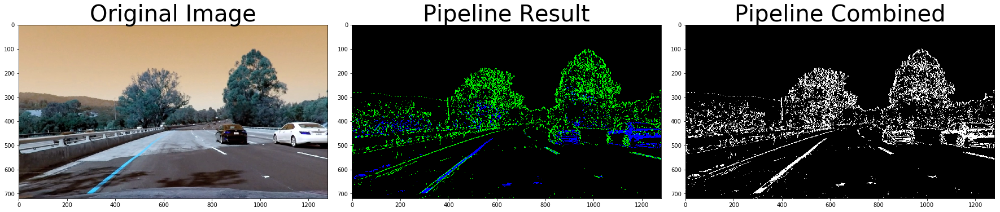

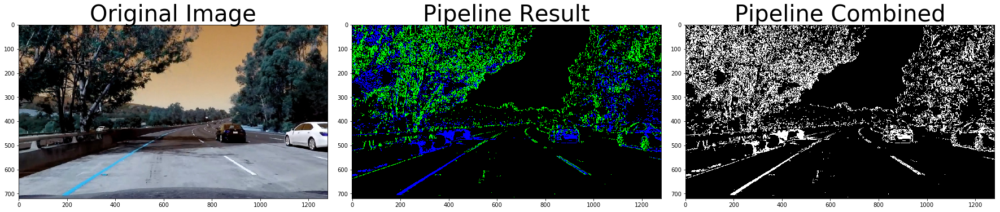

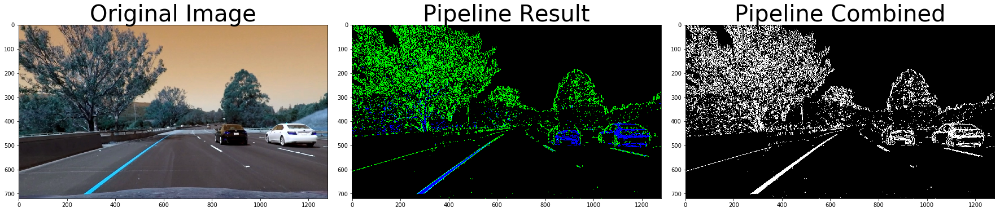

In [29]:
### Thresolds

def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    if orient=='x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    else:
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    # 3) Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # 5) Create a mask of 1's where the scaled gradient magnitude 
    # is > thresh_min and < thresh_max   
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    return binary_output

def mag_thresh(imgimg, sobel_kernel=3, mag_thresh=(0, 255)):
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(imgimg, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Calculate the magnitude 
    sobelxy = np.sqrt(sobel_x**2 + sobel_y**2)
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobel = np.uint8(255*sobelxy/np.max(sobelxy))
    # 5) Create a binary mask where mag thresholds are met
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= mag_thresh[0]) & (scaled_sobel <= mag_thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    return binary_output

def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Take the absolute value of the x and y gradients
    abs_sobel_x = np.absolute(sobel_x)
    abs_sobel_y = np.absolute(sobel_y)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    arctan_sobel = np.arctan2(abs_sobel_y, abs_sobel_x)
    # 5) Create a binary mask where direction thresholds are met
    scaled_sobel = arctan_sobel#np.uint8(255*arctan_sobel/np.max(arctan_sobel))
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    return binary_output

def hls_threshold(img, channel, thresh=(0, 255)):
    # 1) Convert to HLS color space
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    # 2) Apply a threshold to the S channel
    if (channel == 'H'):
        select = hls[:,:,0]
    elif (channel == 'L'):
        select = hls[:,:,1]
    else:
        select = hls[:,:,2]
    
    binary_output = np.zeros_like(S)
    binary_output[(select > thresh[0]) & (select <= thresh[1])] = 1
    # 3) Return a binary image of threshold result
    return binary_output

def thresold_pipeline(img, s_thresh=(170, 255), sx_thresh=(20, 100)):
    img = np.copy(img)
    # Convert to HSV color space and separate the V channel
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    l_channel = hsv[:,:,1]
    s_channel = hsv[:,:,2]
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # Stack each channel
    # Note color_binary[:, :, 0] is all 0s, effectively an all black image. It might
    # be beneficial to replace this channel with something else.
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary))
    color_binaries = []
    
    color_binaries.append(color_binary)
    
    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1
    
    color_binaries.append(combined_binary)
    return color_binaries

# Make a list of test images
images = glob.glob('test_images/undistorted/*.jpg')

# Step through the list 
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    result = thresold_pipeline(img)

    # Plot the result
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
    f.tight_layout()

    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=40)

    ax2.imshow(result[0])
    ax2.set_title('Pipeline Result', fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

    ax3.imshow(result[1], cmap='gray')
    ax3.set_title('Pipeline Combined', fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


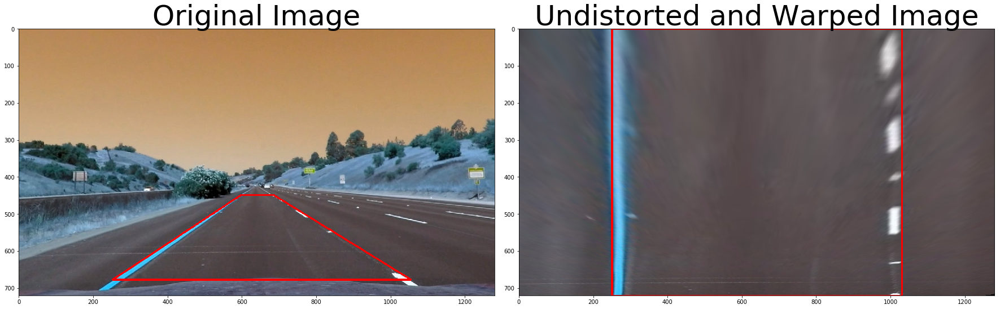

In [30]:
### Perspective Transform

def corners_unwarp(img, nx, ny, mtx, dist):
    # Choose offset from image corners to plot detected corners
    # This should be chosen to present the result at the proper aspect ratio
    offset = 250 # offset for dst points
    
    # Grab the image shape    
    img_size = (img.shape[1], img.shape[0])          
    width, height = img_size
       
    # Different tries on selecting the points to warp the image
    attempt_sel = 2
    
    if (attempt_sel == 4):
        ## Atempt 1
        src = np.float32([
            [  588,   446 ],
            [  691,   446 ],
            [ 1126,   673 ],
            [  153 ,   673 ]])
    elif (attempt_sel == 2):
        ## Attempt 2
        src = np.float32([
            [  598,   448 ],
            [  685,   448 ],
            [ 1055,   677 ],
            [  252 ,   677 ]])
    elif (attempt_sel == 3):
        ## Attempt 3
        sideMargin = 0.14 # percentage of the sides to skip
        topMargin = 0.62 # percentage of the top to skip
        midMargin =0.039 # percentage of mid horizon to include    
        bottomMargin = 0
        shift_x = 20
        src = np.float32([(int((img_size[0]/2)-(img_size[0]*midMargin) + shift_x), int(img_size[1]*topMargin)), 
                           (int((img_size[0]/2)+(img_size[0]*midMargin) + shift_x), int(img_size[1]*topMargin)), 
                           (img_size[0]-int(img_size[0]*sideMargin) + shift_x,img_size[1]-int(img_size[1]*bottomMargin)),
                           (int(img_size[0]*sideMargin) + shift_x,img_size[1]-int(img_size[1]*bottomMargin))])
    elif (attempt_sel == 4):
        ##Attempt 4
        sideMargin = 0.12 # percentage of the sides to skip
        topMargin = 0.62 # percentage of the top to skip
        midMargin =0.04 # percentage of mid horizon to include    
        bottomMargin = 0.06
        shift_x = 0
        src = np.float32([(int((img_size[0]/2)-(img_size[0]*midMargin) + shift_x), int(img_size[1]*topMargin)), 
                           (int((img_size[0]/2)+(img_size[0]*midMargin) + shift_x), int(img_size[1]*topMargin)), 
                           (img_size[0]-int(img_size[0]*sideMargin) + shift_x,img_size[1]-int(img_size[1]*bottomMargin)),
                           (int(img_size[0]*sideMargin) + shift_x,img_size[1]-int(img_size[1]*bottomMargin))])
    
    dst = np.float32([[offset, 0], [img_size[0] - offset, 0], [img_size[0] - offset, img_size[1]], [offset, img_size[1]]])
    # Given src and dst points, calculate the perspective transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    
    # Return the resulting image and matrix
    return warped, M, Minv, src, dst


# Read in an image
img = cv2.imread('test_images/undistorted/straight_lines1_undist.jpg')

top_down, perspective_M, perspective_Minv, src, dst = corners_unwarp(img, cor_h, cor_v, mtx, dist)

img_framed = img
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

pts = np.array([src[0],src[1],src[2],src[3]], np.int32)
pts = pts.reshape((-1,1,2))
cv2.polylines(img_framed,[pts],True,(255,0,0), thickness=4)    
ax1.imshow(img_framed)    
ax1.set_title('Original Image', fontsize=50)

pts = np.array([dst[0],dst[1],dst[2],dst[3]], np.int32)
pts = pts.reshape((-1,1,2))
cv2.polylines(top_down,[pts],True,(255,0,0), thickness=4)    
ax2.imshow(top_down)
ax2.set_title('Undistorted and Warped Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

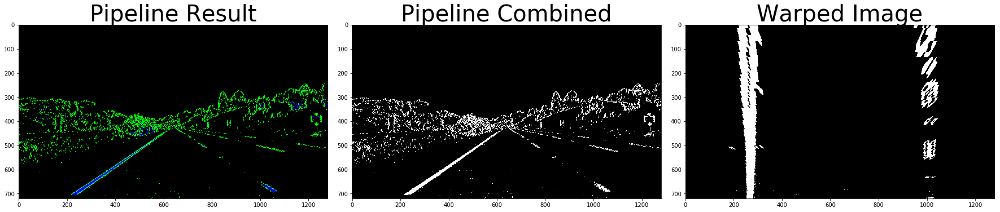

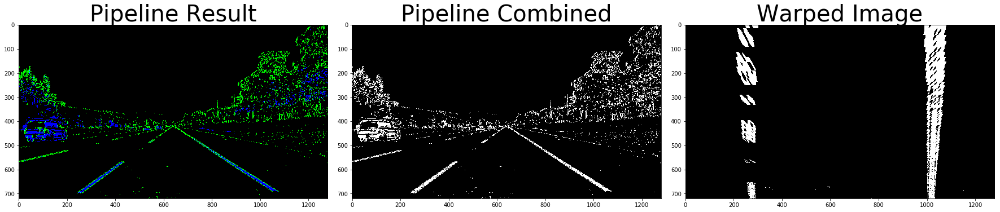

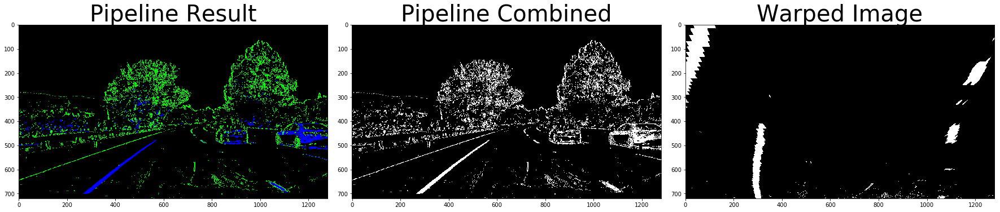

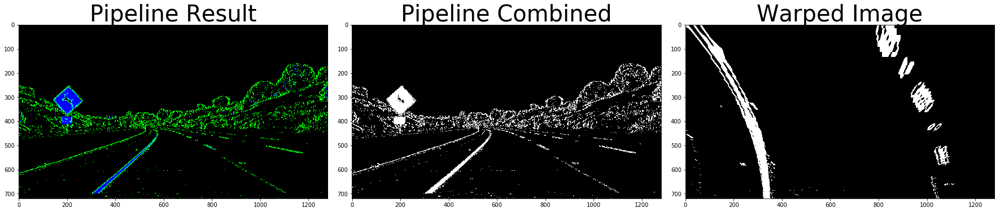

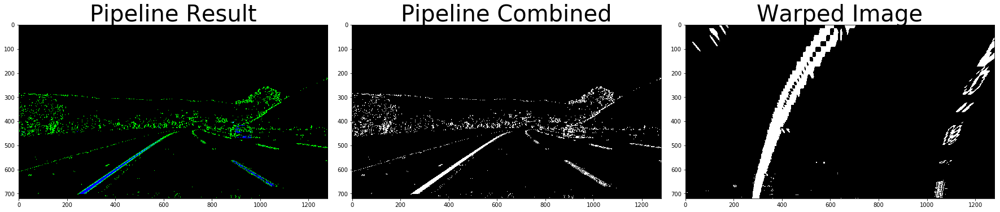

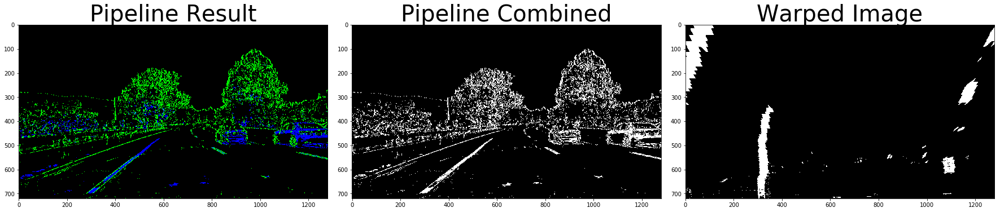

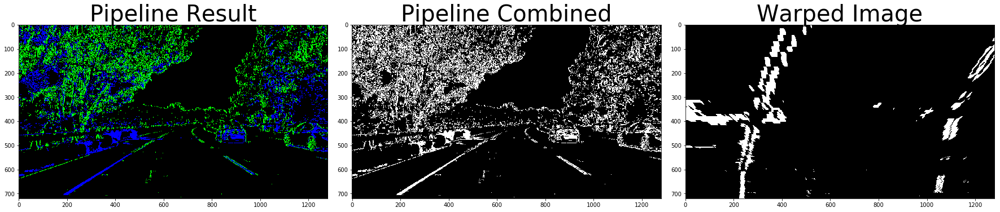

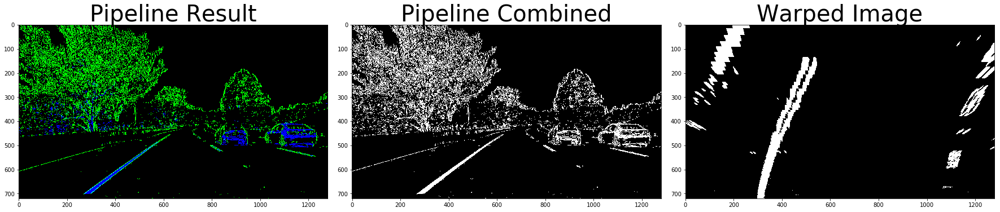

In [31]:
### Preprocessing pipeline

def preprocess(img, cor_h, cor_v, mtx, dist):
    img = cv2.imread(fname)
    pipe = thresold_pipeline(img)
    warped, perspective_M, perspective_Minv, src, dst = corners_unwarp(pipe[1], cor_h, cor_v, mtx, dist)
    return pipe, warped, perspective_M, perspective_Minv, img, src, dst

# Make a list of test images
preprocessed = []
images = glob.glob('test_images/undistorted/*.jpg')

for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    pipe, warped, perspective_M, perspective_Minv, img, src, dst = preprocess(img, cor_h, cor_v, mtx, dist)
    
    preprocessed.append([img, pipe, warped, perspective_M, perspective_Minv, img, src, dst])
    # Plot the result
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
    f.tight_layout()

    ax1.imshow(pipe[0])
    ax1.set_title('Pipeline Result', fontsize=40)

    ax2.imshow(pipe[1], cmap='gray')
    ax2.set_title('Pipeline Combined', fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

    ax3.imshow(warped, cmap='gray')
    ax3.set_title('Warped Image', fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


C:\Users\Josu\Anaconda3\envs\carnd-term1\lib\site-packages\ipykernel\__main__.py:22: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


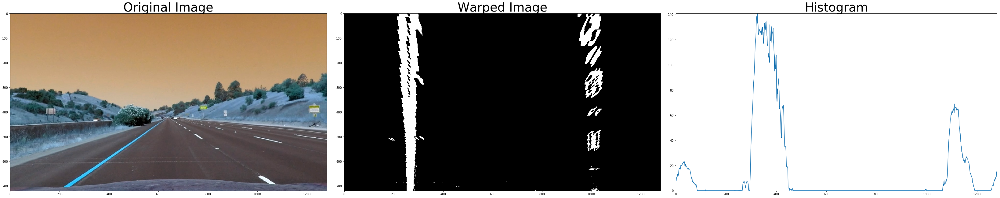

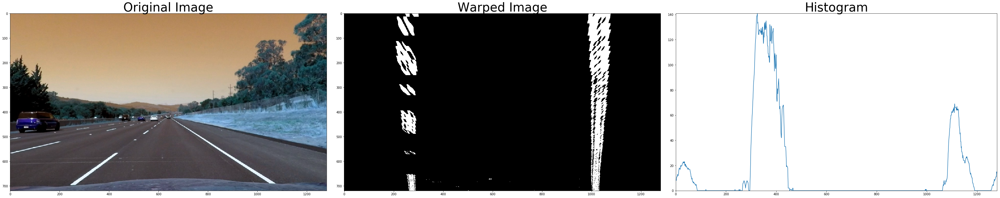

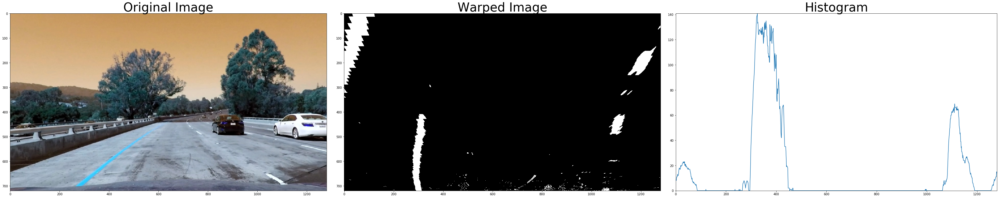

In [32]:
### Lane finding - Histogram

# Make a list of test images
images = glob.glob('test_images/undistorted/*.jpg')

#for idx, fname in enumerate(images):
for prep in preprocessed[0:3]:
    img = prep[0]
    #pipe, warped, perspective_M, src, dst = preprocess(img, cor_h, cor_v, mtx, dist)

    # Plot the result
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(45, 9))
    f.tight_layout()

    ax1.imshow(prep[0])
    ax1.set_title('Original Image', fontsize=40)

    ax2.imshow(prep[2], cmap='gray')
    ax2.set_title('Warped Image', fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

    histogram = np.sum(warped[warped.shape[0]/2:,:], axis=0)
    ax3.set_title('Histogram', fontsize=40)
    ax3.set_height = 10
    ax3.autoscale(tight=True)
    ax3.plot(histogram)
    

In [33]:
### Lane finding - Sliding Windows and Fit Polynomial

# Make a list of test images
images = glob.glob('test_images/undistorted/*.jpg')


def findlines(prep, left_fit, right_fit):

    binary_warped = prep[2]
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]/2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    
    # Choose the number of sliding windows
    if (len(left_fit) == 0 or len(right_fit) == 0):
        nwindows = 9
        # Set height of windows
        window_height = np.int(binary_warped.shape[0]/nwindows)    

        # Step through the windows one by one
        for window in range(nwindows):
            # Identify window boundaries in x and y (and right and left)
            win_y_low = binary_warped.shape[0] - (window+1)*window_height
            win_y_high = binary_warped.shape[0] - window*window_height
            win_xleft_low = leftx_current - margin
            win_xleft_high = leftx_current + margin
            win_xright_low = rightx_current - margin
            win_xright_high = rightx_current + margin
            # Draw the windows on the visualization image
            cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
            cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
            # Identify the nonzero pixels in x and y within the window
            good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
            good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
            # Append these indices to the lists
            left_lane_inds.append(good_left_inds)
            right_lane_inds.append(good_right_inds)
            # If you found > minpix pixels, recenter next window on their mean position
            if len(good_left_inds) > minpix:
                leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
            if len(good_right_inds) > minpix:        
                rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
        # Concatenate the arrays of indices
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)

        # Extract left and right line pixel positions
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds] 
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds] 

        # Fit a second order polynomial to each
        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)    
    else:
        left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
        right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  
        
        # Again, extract left and right line pixel positions
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds] 
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds]
        # Fit a second order polynomial to each
        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)
        # Generate x and y values for plotting
        ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    return left_fit, right_fit, left_lane_inds, right_lane_inds, out_img
    
   

In [34]:
### Get curvature radius
def get_curvature(ploty, left_fitx, right_fitx):
    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    left_curverad_p = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    right_curverad_p = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
    #print(left_curverad, right_curverad)
    
    # Now our radius of curvature is in meters
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space    
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    #print(left_curverad, 'm', right_curverad, 'm')
    return left_curverad_p, right_curverad_p, left_curverad, right_curverad
    

C:\Users\Josu\Anaconda3\envs\carnd-term1\lib\site-packages\ipykernel\__main__.py:12: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
C:\Users\Josu\Anaconda3\envs\carnd-term1\lib\site-packages\ipykernel\__main__.py:22: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


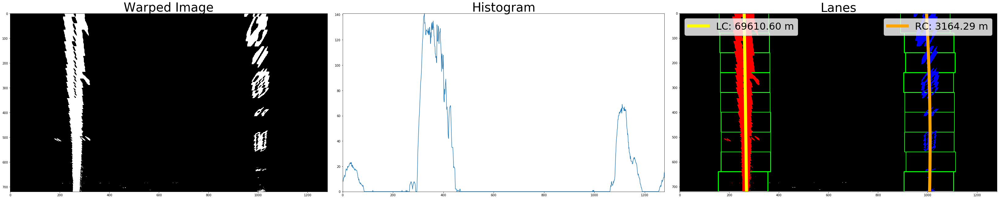

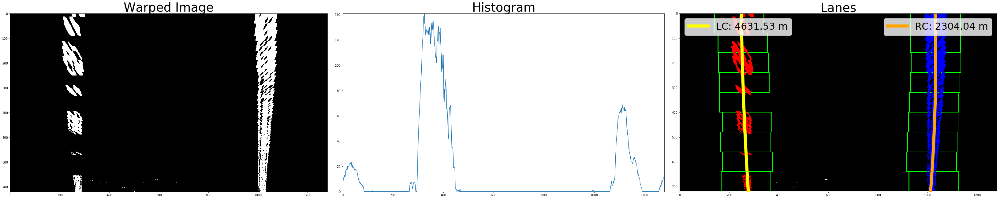

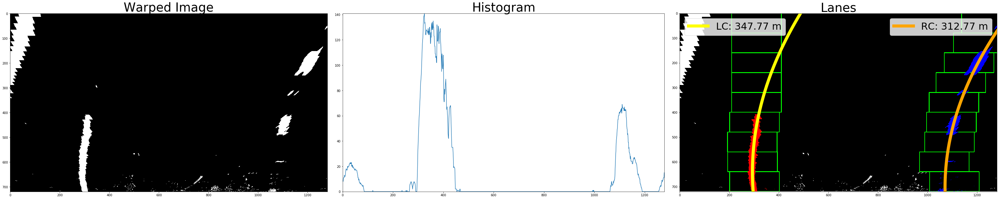

In [35]:
### Find lanes with sliding windows

for prep in preprocessed[0:3]:
    left_fit = []
    right_fit = []
    left_fit, right_fit, left_lane_inds, right_lane_inds, out_img = findlines(prep, left_fit, right_fit)
    
        
    # Plot the result
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(45, 9))
    f.tight_layout()
    
    binary_warped = prep[2]
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    ax1.imshow(prep[2], cmap='gray')
    ax1.set_title('Warped Image', fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

    histogram = np.sum(warped[warped.shape[0]/2:,:], axis=0)
    ax2.set_title('Histogram', fontsize=40)
    ax2.set_height = 10
    ax2.autoscale(tight=True)
    ax2.plot(histogram)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Get curvature radius
    left_curverad_p, right_curverad_p, left_curverad, right_curverad = get_curvature(ploty, left_fitx, right_fitx)
    
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    ax3.imshow(out_img)
    ax3.set_title('Lanes' , fontsize=40)
    ll = ax3.plot(left_fitx, ploty, color='yellow', linewidth=10, label='LC: {0:.2f} m'.format(left_curverad))
    rl = ax3.plot(right_fitx, ploty, color='orange', linewidth=10, label='RC: {0:.2f} m'.format(right_curverad))
    lll = ax3.legend(handles=ll, loc=2, fontsize=32)
    ax = plt.gca().add_artist(lll)
    rll = ax3.legend(handles=rl, loc=1, fontsize=32)
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    
    

C:\Users\Josu\Anaconda3\envs\carnd-term1\lib\site-packages\ipykernel\__main__.py:12: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
C:\Users\Josu\Anaconda3\envs\carnd-term1\lib\site-packages\ipykernel\__main__.py:22: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


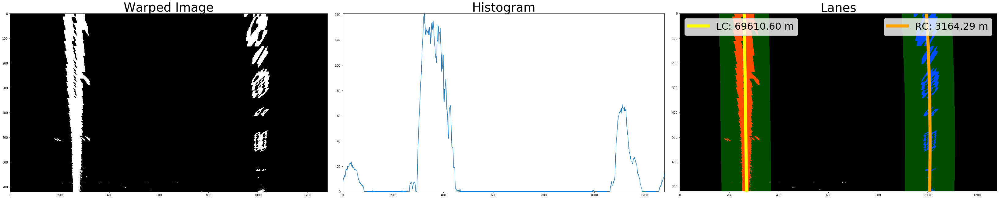

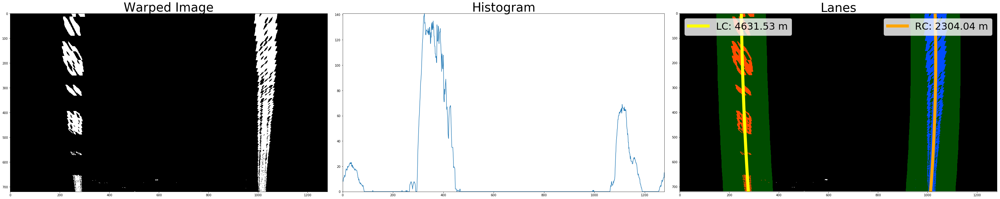

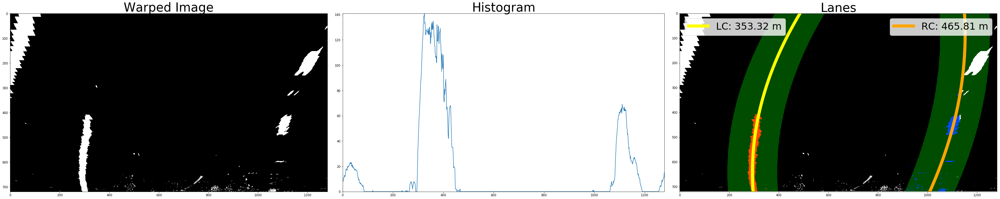

In [36]:
### Find lanes without sliding windows

left_fit = []
right_fit = []
for prep in preprocessed[0:3]:

    
    left_fit, right_fit, left_lane_inds, right_lane_inds, out_img = findlines(prep, left_fit, right_fit)
    # Plot the result
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(45, 9))
    f.tight_layout()
    
    binary_warped = prep[2]
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    ax1.imshow(prep[2], cmap='gray')
    ax1.set_title('Warped Image', fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

    histogram = np.sum(warped[warped.shape[0]/2:,:], axis=0)
    ax2.set_title('Histogram', fontsize=40)
    ax2.set_height = 10
    ax2.autoscale(tight=True)
    ax2.plot(histogram)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    margin = 100
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Get curvature radius
    left_curverad_p, right_curverad_p, left_curverad, right_curverad = get_curvature(ploty, left_fitx, right_fitx)
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    ax3.imshow(result)
    ax3.set_title('Lanes', fontsize=40)
    ll = ax3.plot(left_fitx, ploty, color='yellow', linewidth=10, label='LC: {0:.2f} m'.format(left_curverad))
    rl = ax3.plot(right_fitx, ploty, color='orange', linewidth=10, label='RC: {0:.2f} m'.format(right_curverad))
    lll = ax3.legend(handles=ll, loc=2, fontsize=32)
    ax = plt.gca().add_artist(lll)
    rll = ax3.legend(handles=rl, loc=1, fontsize=32)
    plt.xlim(0, 1280)
    plt.ylim(720, 0)

C:\Users\Josu\Anaconda3\envs\carnd-term1\lib\site-packages\ipykernel\__main__.py:12: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


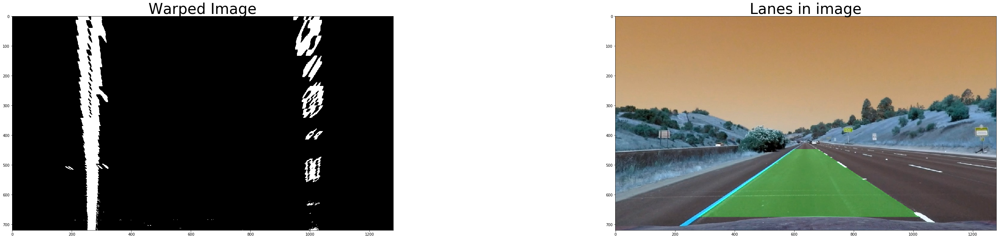

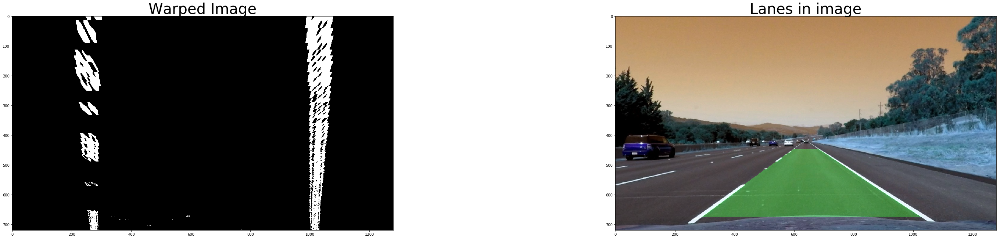

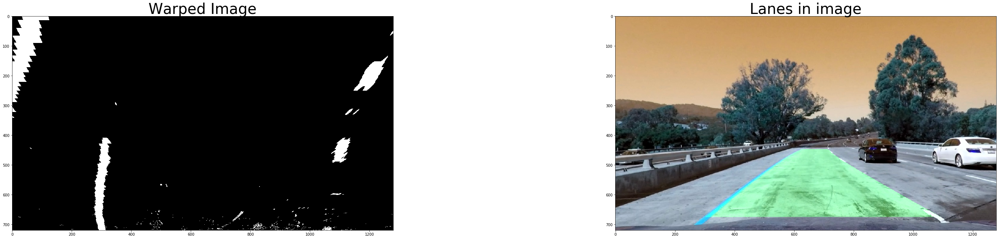

In [37]:
### Find lanes in image

for prep in preprocessed[0:3]:
    left_fit = []
    right_fit = []
    left_fit, right_fit, left_lane_inds, right_lane_inds, out_img = findlines(prep, left_fit, right_fit)
    # Plot the result
    f, (ax1, ax3) = plt.subplots(1, 2, figsize=(45, 9))
    f.tight_layout()
    
    binary_warped = prep[2]
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    ax1.imshow(prep[2], cmap='gray')
    ax1.set_title('Warped Image', fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, prep[4], (prep[5].shape[1], prep[5].shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(prep[5], 1, newwarp, 0.3, 0)
    ax3.imshow(result)
    ax3.set_title('Lanes in image', fontsize=40)

    